<a href="https://colab.research.google.com/github/buinm/homework_fall2021/blob/main/My_lab3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# Assignment 3

This is a template notebook for Assignment 3.


## Install dependencies and initialization

In [1]:
# The next 8 lines added to be compatible with version changes (2022/10/13).
# change cuda to 11.1
import os
p = os.getenv('PATH')
ld = os.getenv('LD_LIBRARY_PATH')
os.environ['PATH'] = f"/usr/local/cuda-11.1/bin:{p}"
os.environ['LD_LIBRARY_PATH'] = f"/usr/local/cuda-11.1/lib64:{ld}"
# change pytorch to 1.9.0 compiled with cuda 11.1
!pip install torch==1.9.0+cu111 torchvision==0.10.0+cu111 -f https://download.pytorch.org/whl/torch_stable.html


# install dependencies: 
!pip install pyyaml==5.1 pycocotools>=2.0.1
# !pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.9/index.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.9/index.html


In [2]:
!pwd # shows current directory
!ls  # shows all files in this directory
!nvidia-smi # shows the specs and the current status of the allocated GPU

/content
'=2.0.1'   drive   sample_data
Sun Oct 23 21:39:14 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   73C    P8    13W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                

In [3]:
# import some common libraries
from google.colab.patches import cv2_imshow
from sklearn.metrics import jaccard_score
from PIL import Image, ImageDraw
from tqdm.notebook import tqdm
import pandas as pd
import numpy as np
import datetime
import random
import json
import cv2
import csv
import os

# import some common pytorch utilities
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torch.autograd import Variable
import torch.nn.functional as F
import torch.nn as nn
import torch

# import some common detectron2 utilities
import detectron2
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.structures import BoxMode
from detectron2.engine import DefaultTrainer
from detectron2.engine import DefaultPredictor
from detectron2.utils.logger import setup_logger
from detectron2.utils.visualizer import ColorMode
from detectron2.utils.visualizer import Visualizer
from detectron2.data import build_detection_test_loader
from detectron2.data import build_detection_train_loader
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
setup_logger()

<Logger detectron2 (DEBUG)>

In [4]:
# Make sure that GPU is available for your notebook. 
# Otherwise, you need to update the settungs in Runtime -> Change runtime type -> Hardware accelerator
torch.cuda.is_available()

True

In [5]:
# You need to mount your google drive in order to load the data:
from google.colab import drive
drive.mount('/content/drive')
# Put all the corresponding data files in a data folder and put the data folder in a same directory with this notebook.
# Also create an output directory for your files such as the trained models and the output images.

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [6]:
# Define the location of current directory, which should contain data/train, data/test, and data/train.json.
# TODO: approx 1 line
# BASE_DIR = '/content/drive/My Drive/Colab Notebooks/03-cnn-detection-segmentation'
BASE_DIR = '/content/drive/My Drive/CMPT_CV_lab3'
OUTPUT_DIR = '{}/output'.format(BASE_DIR)
os.makedirs(OUTPUT_DIR, exist_ok=True)

## Part 1: Object Detection

### Data Loader

In [7]:
# Let's just test converting an image to h5py. UPDATE: 1 image 30MB becomes 50Mb . Image becomes larger
# NOte this piece of code should be ran only once
#IMPORTANT: Test data needs to be added to the same file as well
#TODO: ADD test data to the same h5py file 
import h5py
from PIL import Image

# # fileName = 'data_train.h5'
fileName = h5py.File('{}/data/train_h5/data_train.hdf5'.format(BASE_DIR),'w')
grp=fileName.create_group('train_data')

# # with h5py.File('{}/data/train_h5/{}'.format(BASE_DIR, fileName), "a") as out:
# #    img = Image.open("{}/data/train/P0036.png".format(BASE_DIR))      # X_train_1.jpg is 256 x 256 RGB image
# #    out['X_train'] = np.asarray(img)
train_or_test_dir = '{}/data/train'.format(BASE_DIR)
imgs = os.listdir(train_or_test_dir)
# print(arr)

for im in imgs:
  img_arr = Image.open("{}/data/train/{}".format(BASE_DIR, im))
  img_arr_np = np.asarray(img_arr)
  
  # If image is 2D, create its 3 channel image
  if len(img_arr_np.shape) == 2:
    print("here")
    img_arr_np = np.dstack((img_arr_np, img_arr_np, img_arr_np))

  grp.create_dataset(im,data=img_arr_np) 
  img_arr.close()



here
here
here
here
here
here
here
here
here
here
here
here
here
here
here
here
here
here
here
here
here
here
here
here
here
here
here
here
here
here
here
here
here
here
here
here


In [8]:
# f = h5py.File('{}/data/train_h5/data_train.hdf5'.format(BASE_DIR), 'r')
# print('hdf5 file size: %d bytes'%os.path.getsize('{}/data/train_h5/data_train.hdf5'.format(BASE_DIR)))
# print(list(fileName['train_data'].keys()))
# height, width = grp['P0036.png'].shape[:2]
# print(height)
# print(width)


In [9]:
import time
start = time.time()
fack = h5py.File('{}/data/train_h5/data_train.hdf5'.format(BASE_DIR), 'r')
train_data = fack['train_data']
start = time.time()
ass = fack['train_data']['P0160.png']
print("h5py retrive time {}".format(time.time() - start))
# height, width = ass.shape[:2]
# print(height)
# print(width)
start = time.time()
img = Image.open("{}/data/train/P0036.png".format(BASE_DIR))
print("Image retrive time {}".format(time.time() - start))



h5py retrive time 0.0007486343383789062
Image retrive time 0.006749153137207031


In [10]:
'''
# This function should return a list of data samples in which each sample is a dictionary. 
# Make sure to select the correct bbox_mode for the data
# For the test data, you only have access to the images, therefore, the annotations should be empty.
# Other values could be obtained from the image files.
# TODO: approx 35 lines
'''

# TODO: split training data by randomly choosing the files in training folder  
my_data = fack['train_data']
def get_detection_data(set_name):
  data_dirs = '{}/data'.format(BASE_DIR)

  json_file = os.path.join(data_dirs, "train.json")
  train_or_test_dir = os.path.join(data_dirs, set_name)

  if set_name == "train":
    with open(json_file) as f:
        imgs_anns = json.load(f)

        """
        Annotations record look like this:
        records = { image1_filename : [annotation1, annotation2, ...],
                    image2_filename : {}, ...}
        where each annotation is a dictionary: {"id": bla, "segmentation" : bla, "category_id" : bla}
        """
        # records = [ {x["file_name"]: [{k: v} for k, v in x.items() if k != "file_name"]}  for x in imgs_anns ]
        # print(imgs_anns[0])
        annotation_records = {}
        for x in imgs_anns:
          if x["file_name"] not in annotation_records:
            annotation_records[x["file_name"]] = []
          # create a new list
          annotation_records[x["file_name"]].append({ k: v for k, v in x.items() if k != "file_name"})

  dataset = []
  
  # Train only
  # Iterate through the test or train folder
  for idx, fname in enumerate(os.listdir(train_or_test_dir)):
      record = {}
      #print(train_or_test_dir)
      # height, width = my_data[fname].shape[:2]

      # file_path = os.path.join(train_or_test_dir, fname)
      #height, width = cv2.imread(file_path).shape[:2]
      # a = my_data[fname]
      # height = my_data[fname].shape[0]
      # width = my_data[fname].shape[1]
      height, width = my_data[fname].shape[:2]

      if my_data[fname].shape[2] ==3 :
        print("fuck")

      record["file_name"] = fname
      record["height"] = height
      record["width"] = width
      # Use its filename as unique image id
      # record["image_id"] = filename
      record["image_id"] = idx
      objs = []
      if set_name == "train":
        for rec in annotation_records[fname]:
          obj = {
              "bbox": rec["bbox"],
              "bbox_mode": BoxMode.XYWH_ABS, 
              "segmentation": rec["segmentation"],
              "category_id": 0,
              #"category_id": rec["category_id"],
          }
          objs.append(obj)

      # If test or validation, this annotations objs list is empty 
      record["annotations"] = objs
      dataset.append(record)

  return dataset



In [11]:
'''
# Remember to add your dataset to DatasetCatalog and MetadataCatalog
# Consdier "data_detection_train" and "data_detection_test" for registration
# You can also add an optional "data_detection_val" for your validation by spliting the training data
# TODO: approx 5 lines
'''

for d in ["train", "val"]:
    DatasetCatalog.register("data_detection_" + d, lambda d=d: get_detection_data(d))
    MetadataCatalog.get("data_detection_" + d).set(thing_classes=["plane"])
plane_metadata = MetadataCatalog.get("data_detection_train")
# dataset_dicts = get_detection_data("train")



fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
fuck
4853
3904


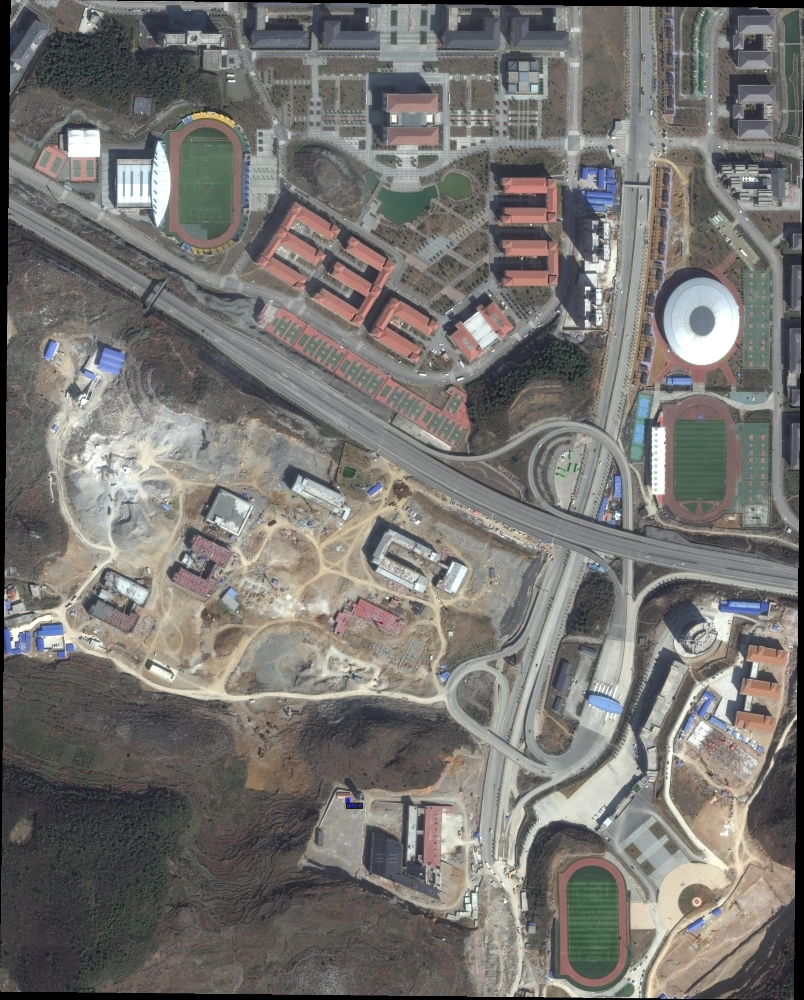

1339
2480


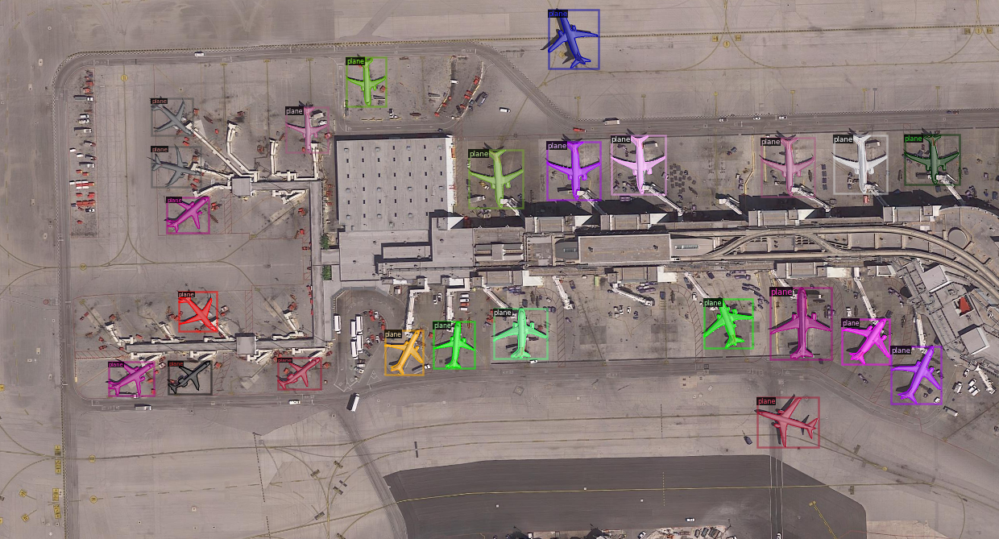

1636
1485


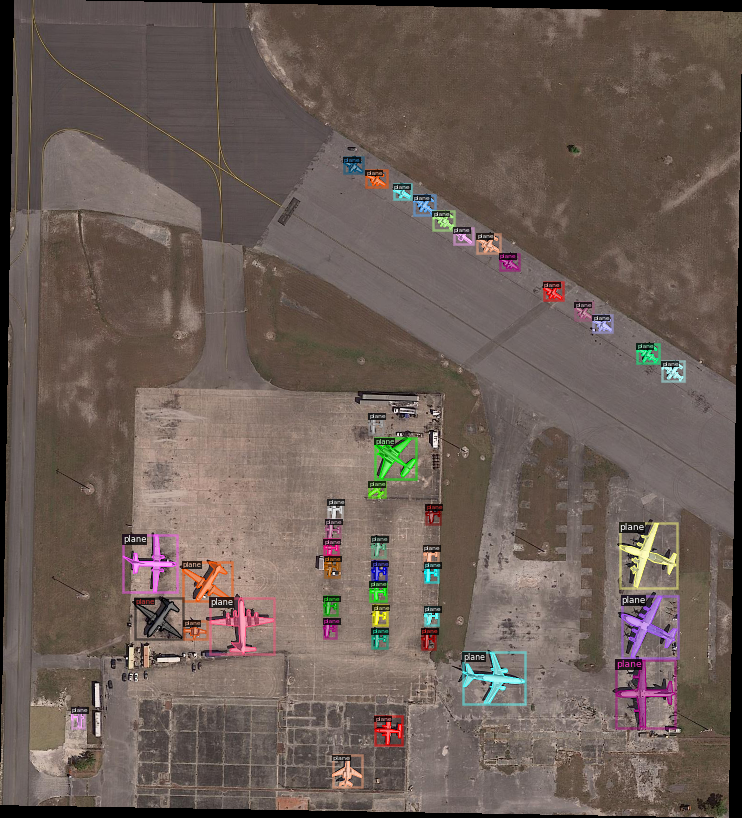

In [12]:
'''
# Visualize some samples using Visualizer to make sure that the function works correctly
# TODO: approx 5 lines
'''

dataset_dicts = get_detection_data("train")
# !pwd
# print(train_metadata)
for d in random.sample(dataset_dicts, 3):
    # print(d)
    img_name = '{}/data/train/{}'.format(BASE_DIR, d["file_name"])
    # img = cv2.imread(d["file_name"])
    img = cv2.imread(img_name)
    # print(img[:, :, ::-1])
    # print(d)
    visualizer = Visualizer(img[:, :, ::-1], metadata=plane_metadata, scale=0.5)
    # Debugging
    # names  = train_metadata.get("thing_classes", None)
    annos = d.get("annotations", None)
    print(d["height"])
    print(d["width"])
    c_ids = [x["category_id"] for x in annos]
    # print(len(annos))
    #print(len(c_ids))


    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])



### Set Configs

In [13]:
'''
# Set the configs for the detection part in here.
# TODO: approx 15 lines
'''
# cfg = get_cfg()
# cfg.OUTPUT_DIR = "{}/output/".format(BASE_DIR)

# Sample code

cfg = get_cfg()
cfg.OUTPUT_DIR = "{}/output/".format(BASE_DIR)
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml"))
# cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))

cfg.DATASETS.TRAIN = ("data_detection_train",)
cfg.DATASETS.TEST = () # Validation set goes here
cfg.DATALOADER.NUM_WORKERS = 0
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 500    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (plane). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)




In [14]:
# Create a custom data loader to read from h5 files
from detectron2.data import detection_utils as utils
import copy
 # Show how to implement a minimal mapper, similar to the default DatasetMapper
def mapper(dataset_dict):
    dataset_dict = copy.deepcopy(dataset_dict)  # it will be modified by code below
    # can use other ways to read image
    # image = utils.read_image(dataset_dict["file_name"], format="BGR")
    # f = h5py.File('{}/data/train_h5/data_train.hdf5'.format(BASE_DIR), 'r')
    image = np.asarray(my_data[dataset_dict["file_name"]])
    # h, w = image.shape[:2]
    image = np.moveaxis(image, 2, 0)
    image = torch.from_numpy(image)

    # Read from h5py file

    # See "Data Augmentation" tutorial for details usage
    # annos = [
    #     utils.transform_instance_annotations(annotation, [transform], image.shape[1:])
    #     for annotation in dataset_dict.pop("annotations")
    # ]
    # return {
    #    # create the format that the model expects
    #    "image": image,
    #    "instances": utils.annotations_to_instances(annos, image.shape[1:])
    # }

    return {
       # create the format that the model expects
       "image": image,
       "width": dataset_dict["width"],
       "height": dataset_dict["height"]
       #"instances": torch.tensor(dataset_dict["annotations"])
    }
# dataloader = build_detection_train_loader(cfg, mapper=mapper)

### Training

In [15]:
'''
# Create a DefaultTrainer using the above config and train the model
# TODO: approx 5 lines
'''

# Can't use the defaultTrainer, need to overwrite it with our data loader
class Trainer(DefaultTrainer):
  @classmethod
  def build_train_loader(cls, cfg):
      return build_detection_train_loader(cfg, mapper=mapper)

trainer = Trainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

# Training curves
%load_ext tensorboard
%tensorboard --logdir output

[10/23 21:41:26 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[10/23 21:41:42 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  /pytorch/aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


ERROR [10/23 21:41:43 d2.engine.train_loop]: Exception during training:
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/detectron2/engine/train_loop.py", line 149, in train
    self.run_step()
  File "/usr/local/lib/python3.7/dist-packages/detectron2/engine/defaults.py", line 494, in run_step
    self._trainer.run_step()
  File "/usr/local/lib/python3.7/dist-packages/detectron2/engine/train_loop.py", line 273, in run_step
    loss_dict = self.model(data)
  File "/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py", line 1051, in _call_impl
    return forward_call(*input, **kwargs)
  File "/usr/local/lib/python3.7/dist-packages/detectron2/modeling/meta_arch/rcnn.py", line 157, in forward
    proposals, proposal_losses = self.proposal_generator(images, features, gt_instances)
  File "/usr/local/lib/python3.7/dist-packages/torch/nn/modules/module.py", line 1051, in _call_impl
    return forward_call(*input, **kwargs)
  File "/usr/local/lib/p

AssertionError: ignored

### Evaluation and Visualization

In [ ]:
'''
# After training the model, you need to update cfg.MODEL.WEIGHTS
# Define a DefaultPredictor
'''

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6   # set a custom testing threshold
predictor = DefaultPredictor(cfg)


In [ ]:
'''
# Visualize the output for 3 random test samples
# TODO: approx 10 lines
'''
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_detection_data("test")
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=plane_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])


In [ ]:
'''
# Use COCOEvaluator and build_detection_train_loader
# You can save the output predictions using inference_on_dataset
# TODO: approx 5 lines
'''

from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("balloon_val", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "balloon_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))



### Improvements

For this part, you can bring any improvement which you have by adding new input parameters to the previous functions or defining new functions and variables.

In [ ]:
'''
# Bring any changes and updates regarding the improvement in here
'''


## Part 2: Semantic Segmentation

### Data Loader

In [ ]:
'''
# Write a function that returns the cropped image and corresponding mask regarding the target bounding box
# idx is the index of the target bbox in the data
# high-resolution image could be passed or could be load from data['file_name']
# You can use the mask attribute of detectron2.utils.visualizer.GenericMask 
#     to convert the segmentation annotations to binary masks
# TODO: approx 10 lines
'''

def get_instance_sample(data, idx, img=None):
  
  return obj_img, obj_mask

In [ ]:
'''
# We have provided a template data loader for your segmentation training
# You need to complete the __getitem__() function before running the code
# You may also need to add data augmentation or normalization in here
'''

class PlaneDataset(Dataset):
  def __init__(self, set_name, data_list):
      self.transforms = transforms.Compose([
          transforms.ToTensor(), # Converting the image to tensor and change the image format (Channels-Last => Channels-First)
      ])
      self.set_name = set_name
      self.data = data_list
      self.instance_map = []
      for i, d in enumerate(self.data):
        for j in range(len(d['annotations'])):
          self.instance_map.append([i,j])

  '''
  # you can change the value of length to a small number like 10 for debugging of your training procedure and overfeating
  # make sure to use the correct length for the final training
  '''
  def __len__(self):
      return len(self.instance_map)

  def numpy_to_tensor(self, img, mask):
    if self.transforms is not None:
        img = self.transforms(img)
    img = torch.tensor(img, dtype=torch.float)
    mask = torch.tensor(mask, dtype=torch.float)
    return img, mask

  '''
  # Complete this part by using get_instance_sample function
  # make sure to resize the img and mask to a fixed size (for example 128*128)
  # you can use "interpolate" function of pytorch or "numpy.resize"
  # TODO: 5 lines
  '''
  def __getitem__(self, idx):
    if torch.is_tensor(idx):
        idx = idx.tolist()
    idx = self.instance_map[idx]
    data = self.data[idx[0]]
    

    return img, mask

def get_plane_dataset(set_name='train', batch_size=2):
    my_data_list = DatasetCatalog.get("data_detection_{}".format(set_name))
    dataset = PlaneDataset(set_name, my_data_list)
    loader = DataLoader(dataset, batch_size=batch_size, num_workers=4,
                                              pin_memory=True, shuffle=True)
    return loader, dataset

### Network

In [ ]:
'''
# convolution module as a template layer consists of conv2d layer, batch normalization, and relu activation
'''
class conv(nn.Module):
    def __init__(self, in_ch, out_ch, activation=True):
        super(conv, self).__init__()
        if(activation):
          self.layer = nn.Sequential(
             nn.Conv2d(in_ch, out_ch, 3, padding=1),
             nn.BatchNorm2d(out_ch),
             nn.ReLU(inplace=True)
          )
        else:
          self.layer = nn.Sequential(
             nn.Conv2d(in_ch, out_ch, 3, padding=1)  
             )

    def forward(self, x):
        x = self.layer(x)
        return x

'''
# downsampling module equal to a conv module followed by a max-pool layer
'''
class down(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(down, self).__init__()
        self.layer = nn.Sequential(
            conv(in_ch, out_ch),
            nn.MaxPool2d(2)
            )

    def forward(self, x):
        x = self.layer(x)
        return x

'''
# upsampling module equal to a upsample function followed by a conv module
'''
class up(nn.Module):
    def __init__(self, in_ch, out_ch, bilinear=False):
        super(up, self).__init__()
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_ch, in_ch, 2, stride=2)

        self.conv = conv(in_ch, out_ch)

    def forward(self, x):
        y = self.up(x)
        y = self.conv(y)
        return y

'''
# the main model which you need to complete by using above modules.
# you can also modify the above modules in order to improve your results.
'''
class MyModel(nn.Module):
    def __init__(self):
        super(MyModel, self).__init__()
        
        # Encoder
        
        self.input_conv = conv(3, 4)
        self.down = down(4, 8)
        
        # Decoder
        
        self.up = up(8, 4)
        self.output_conv = conv(4, 1, False) # ReLu activation is removed to keep the logits for the loss function
        

    def forward(self, input):
      y = self.input_conv(input)
      y = self.down(y)
      y = self.up(y)
      output = self.output_conv(y)
      return output

### Training

In [ ]:
'''
# The following is a basic training procedure to train the network
# You need to update the code to get the best performance
# TODO: approx ? lines
'''

# Set the hyperparameters
num_epochs = 5
batch_size = 4
learning_rate = 0.01
weight_decay = 1e-5

model = MyModel() # initialize the model
model = model.cuda() # move the model to GPU
loader, _ = get_plane_dataset('train', batch_size) # initialize data_loader
crit = nn.BCEWithLogitsLoss() # Define the loss function
optim = torch.optim.SGD(model.parameters(), lr=learning_rate, weight_decay=weight_decay) # Initialize the optimizer as SGD

# start the training procedure
for epoch in range(num_epochs):
  total_loss = 0
  for (img, mask) in tqdm(loader):
    img = torch.tensor(img, device=torch.device('cuda'), requires_grad = True)
    mask = torch.tensor(mask, device=torch.device('cuda'), requires_grad = True)
    pred = model(img)
    loss = crit(pred, mask)
    optim.zero_grad()
    loss.backward()
    optim.step()
    total_loss += loss.cpu().data
  print("Epoch: {}, Loss: {}".format(epoch, total_loss/len(loader)))
  torch.save(model.state_dict(), '{}/output/{}_segmentation_model.pth'.format(BASE_DIR, epoch))

'''
# Saving the final model
'''
torch.save(model.state_dict(), '{}/output/final_segmentation_model.pth'.format(BASE_DIR))


### Evaluation and Visualization

In [ ]:
'''
# Before starting the evaluation, you need to set the model mode to eval
# You may load the trained model again, in case if you want to continue your code later
# TODO: approx 15 lines
'''
batch_size = 8
model = MyModel().cuda()
model.load_state_dict(torch.load('{}/output/final_segmentation_model.pth'.format(BASE_DIR)))
model = model.eval() # chaning the model to evaluation mode will fix the bachnorm layers
loader, dataset = get_plane_dataset('train', batch_size)

total_iou = 0
for (img, mask) in tqdm(loader):
  with torch.no_grad():
    img = img.cuda()
    mask = mask.cuda()
    mask = torch.unsqueeze(mask,1)
    pred = model(img)

    '''
    ## Complete the code by obtaining the IoU for each img and print the final Mean IoU
    '''
    

print("\n #images: {}, Mean IoU: {}".format(_, _))


In [ ]:
'''
# Visualize 3 sample outputs
# TODO: approx 5 lines
'''


## Part 3: Instance Segmentation

In this part, you need to obtain the instance segmentation results for the test data by using the trained segmentation model in the previous part and the detection model in Part 1.

### Get Prediction

In [ ]:
'''
# Define a new function to obtain the prediction mask by passing a sample data
# For this part, you need to use all the previous parts (predictor, get_instance_sample, data preprocessings, etc)
# It is better to keep everything (as well as the output of this funcion) on gpu as tensors to speed up the operations.
# pred_mask is the instance segmentation result and should have different values for different planes.
# TODO: approx 35 lines
'''

def get_prediction_mask(data):

  return img, gt_mask, pred_mask # gt_mask could be all zero when the ground truth is not given.


### Visualization and Submission

In [ ]:
'''
# Visualise the output prediction as well as the GT Mask and Input image for a sample input
# TODO: approx 10 lines
'''



In [ ]:
'''
# ref: https://www.kaggle.com/rakhlin/fast-run-length-encoding-python
# https://www.kaggle.com/c/airbus-ship-detection/overview/evaluation
'''
def rle_encoding(x):
    '''
    x: pytorch tensor on gpu, 1 - mask, 0 - background
    Returns run length as list
    '''
    dots = torch.where(torch.flatten(x.long())==1)[0]
    if(len(dots)==0):
      return []
    inds = torch.where(dots[1:]!=dots[:-1]+1)[0]+1
    inds = torch.cat((torch.tensor([0], device=torch.device('cuda'), dtype=torch.long), inds))
    tmpdots = dots[inds]
    inds = torch.cat((inds, torch.tensor([len(dots)], device=torch.device('cuda'))))
    inds = inds[1:] - inds[:-1]
    runs = torch.cat((tmpdots, inds)).reshape((2,-1))
    runs = torch.flatten(torch.transpose(runs, 0, 1)).cpu().data.numpy()
    return ' '.join([str(i) for i in runs])

In [ ]:
'''
# You need to upload the csv file on kaggle
# The speed of your code in the previous parts highly affects the running time of this part
'''

preddic = {"ImageId": [], "EncodedPixels": []}

'''
# Writing the predictions of the training set
'''
my_data_list = DatasetCatalog.get("data_detection_{}".format('train'))
for i in tqdm(range(len(my_data_list)), position=0, leave=True):
  sample = my_data_list[i]
  sample['image_id'] = sample['file_name'].split("/")[-1][:-4]
  img, true_mask, pred_mask = get_prediction_mask(sample)
  inds = torch.unique(pred_mask)
  if(len(inds)==1):
    preddic['ImageId'].append(sample['image_id'])
    preddic['EncodedPixels'].append([])
  else:
    for index in inds:
      if(index == 0):
        continue
      tmp_mask = (pred_mask==index)
      encPix = rle_encoding(tmp_mask)
      preddic['ImageId'].append(sample['image_id'])
      preddic['EncodedPixels'].append(encPix)

'''
# Writing the predictions of the test set
'''

my_data_list = DatasetCatalog.get("data_detection_{}".format('test'))
for i in tqdm(range(len(my_data_list)), position=0, leave=True):
  sample = my_data_list[i]
  sample['image_id'] = sample['file_name'].split("/")[-1][:-4]
  img, true_mask, pred_mask = get_prediction_mask(sample)
  inds = torch.unique(pred_mask)
  if(len(inds)==1):
    preddic['ImageId'].append(sample['image_id'])
    preddic['EncodedPixels'].append([])
  else:
    for j, index in enumerate(inds):
      if(index == 0):
        continue
      tmp_mask = (pred_mask==index).double()
      encPix = rle_encoding(tmp_mask)
      preddic['ImageId'].append(sample['image_id'])
      preddic['EncodedPixels'].append(encPix)

pred_file = open("{}/pred.csv".format(BASE_DIR), 'w')
pd.DataFrame(preddic).to_csv(pred_file, index=False)
pred_file.close()


## Part 4: Mask R-CNN

For this part you need to follow a same procedure to part 2 with the configs of Mask R-CNN, other parts are generally the same as part 2.

### Data Loader

### Network

### Training

### Evaluation and Visualization